#### Import all library

In [1]:
# import relevant modules
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as sn
import scipy.stats as stats
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
%matplotlib inline

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')



#### Load the Data set.

In [2]:
custdata_df = pd.read_excel('CREDIT CARD USERS DATA.xlsx')
#credit.head(2)

In [3]:
custdata_df.sample(5)

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
3245,9121-JUBJOI-RVF,5,4.0,0,31,3,June,17,4,1,...,1,1,1,1,1,0,1,0,0,0
1244,0243-FFVTII-MLA,5,5.0,0,53,5,May,15,3,2,...,1,1,0,1,1,1,1,0,0,0
2349,0370-ZJULGD-MOV,1,1.0,0,46,4,September,10,1,6,...,1,0,0,0,0,0,1,0,0,0
4616,6505-GAEHYO-NRP,4,3.0,0,71,6,May,12,2,3,...,1,0,0,0,0,0,1,1,0,0
463,6319-CCXCLW-7UL,5,4.0,0,44,4,March,14,2,2,...,1,1,1,1,1,0,0,0,0,0


In [4]:
# Find column information in the dataframe.
custdata_df.columns

Index(['custid', 'region', 'townsize', 'gender', 'age', 'agecat', 'birthmonth',
       'ed', 'edcat', 'jobcat',
       ...
       'owncd', 'ownpda', 'ownpc', 'ownipod', 'owngame', 'ownfax', 'news',
       'response_01', 'response_02', 'response_03'],
      dtype='object', length=132)

### Creating Dependent Y column

In [5]:
#To create Y we need to sumup cardspent(first card spent amount) and card2spent(Second card spent amount)
custdata_df['totalspend'] = custdata_df['cardspent'] + custdata_df['card2spent']

In [6]:
custdata_df.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,totalspend
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,149.46
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,77.54
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,359.97
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,359.41
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,507.83


In [8]:
# Now Run pandas profiling to see the data audit reports

import pandas_profiling
pandas_profiling.ProfileReport(custdata_df)

### Drop Variables

In [9]:
#Drop cardspent(first card spent amount) and card2spent(Second card spent amount) because its not adding any value
#Also  we are droping "custid","birthmonth" bacuse cust id is unique and birth month is not adding any value

custdata_df.drop(["cardspent","card2spent","custid"],axis=1, inplace=True)

In [10]:
#Item count need to drop promary and secondary Iem count

### Check linearlity of data:

1. Use scatter plot by using 'df.plot' or if you want a linear line you can use 'sns.lmplot' through seaborn.

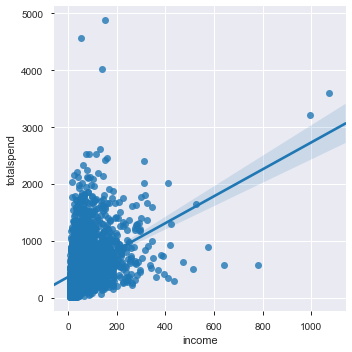

In [11]:
# Seaborn scatter plot with regression line
# aspect=1.5, scatter_kws={'alpha':0.2}) - You can choose this option too.
sns.lmplot(x='income', y='totalspend', data=custdata_df)

So we can see above most data points are near to line which means our data is normal and we can go ahed for further process.

In [12]:
# Creating Categorical List= Contains categorical variables...

for x in ['region','townsize','gender','agecat','edcat','birthmonth','jobcat','union','employ','empcat','retire',
          'inccat','default','jobsat','marital','spousedcat','homeown','hometype','address','addresscat','cars','carown',
          'cartype','carcatvalue','carbought','carbuy','commute','commutecat','commutecar',
          'commutemotorcycle','commutecarpool','commutebus','commuterail','commutepublic','commutebike','commutewalk',
         'commutenonmotor','telecommute','reason','polview','polparty','polcontrib','vote','card','cardtype','cardbenefit',
         'cardfee','cardtenure','cardtenurecat','card2','card2type','card2benefit','card2fee','card2tenure','card2tenurecat',
         'active','bfast','churn','tollfree','equip','callcard','wireless','multline','voice','pager','internet','callid',
         'callwait','forward','confer','ebill','owntv','ownvcr','owndvd','owncd','ownpda','ownpc','ownipod','owngame','ownfax',
        'news','response_01','response_02','response_03']:
    custdata_df[x]=custdata_df[x].astype('object')

### Separate numerical and categorical variable

To do that you need to apply for loop along with if condition.

In [13]:
# Find numerical variable in Data frame.
# This will return a list
numeric_var_names = [key for key in dict(custdata_df.dtypes) if dict(custdata_df.dtypes)[key] in ['float64', 'int64', 'float32', 'int32']]

# Find Categorical variable in Data frame
cat_var_names = [key for key in dict(custdata_df.dtypes) if dict(custdata_df.dtypes)[key] in ['object']]

#Print the data frame
print( numeric_var_names)
print(cat_var_names)

['age', 'ed', 'income', 'lninc', 'debtinc', 'creddebt', 'lncreddebt', 'othdebt', 'lnothdebt', 'spoused', 'reside', 'pets', 'pets_cats', 'pets_dogs', 'pets_birds', 'pets_reptiles', 'pets_small', 'pets_saltfish', 'pets_freshfish', 'carvalue', 'commutetime', 'carditems', 'card2items', 'tenure', 'longmon', 'lnlongmon', 'longten', 'lnlongten', 'tollmon', 'lntollmon', 'tollten', 'lntollten', 'equipmon', 'lnequipmon', 'equipten', 'lnequipten', 'cardmon', 'lncardmon', 'cardten', 'lncardten', 'wiremon', 'lnwiremon', 'wireten', 'lnwireten', 'hourstv', 'totalspend']
['region', 'townsize', 'gender', 'agecat', 'birthmonth', 'edcat', 'jobcat', 'union', 'employ', 'empcat', 'retire', 'inccat', 'default', 'jobsat', 'marital', 'spousedcat', 'homeown', 'hometype', 'address', 'addresscat', 'cars', 'carown', 'cartype', 'carcatvalue', 'carbought', 'carbuy', 'commute', 'commutecat', 'commutecar', 'commutemotorcycle', 'commutecarpool', 'commutebus', 'commuterail', 'commutepublic', 'commutebike', 'commutewalk'

In [14]:
#Convert a list in to dataframe 
#Information about numericvariable in custdata_df

custdata_df_num=custdata_df[numeric_var_names]
custdata_df_num.head(5)

,age,ed,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,spoused,...,cardmon,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,totalspend
0,20,15,31,3.433987,11.1,1.200909,0.183079,2.240091,0.806516,-1,...,14.25,2.656757,60.0,4.094345,0.00,NaN,0.00,NaN,13,149.46
1,22,17,15,2.708050,18.6,1.222020,0.200505,1.567980,0.449788,-1,...,16.00,2.772589,610.0,6.413459,45.65,3.821004,1683.55,7.428660,18,77.54
2,67,14,35,3.555348,9.9,0.928620,-0.074056,2.536380,0.930738,13,...,23.00,3.135494,1410.0,7.251345,0.00,NaN,0.00,NaN,21,359.97
3,23,16,20,2.995732,5.7,0.022800,-3.780995,1.117200,0.110826,18,...,21.00,3.044522,685.0,6.529419,0.00,NaN,0.00,NaN,26,359.41
4,26,16,23,3.135494,1.7,0.214659,-1.538705,0.176341,-1.735336,13,...,17.25,2.847812,360.0,5.886104,19.05,2.947067,410.80,6.018106,27,507.83


In [15]:
#Convert a list in to dataframe 
#Information about categorical variable in custdata_df

custdata_df_cat=custdata_df[cat_var_names]
custdata_df_cat.head(5)

,region,townsize,gender,agecat,birthmonth,edcat,jobcat,union,employ,empcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,1,2,1,2,September,3,1,1,0,1,...,0,0,0,1,1,0,0,0,1,0
1,5,5,0,2,May,4,2,0,0,1,...,1,1,1,1,1,1,1,0,0,0
2,3,4,1,6,June,2,2,0,16,5,...,1,0,0,0,0,0,1,0,0,0
3,4,3,0,2,May,3,2,0,0,1,...,1,0,1,1,1,0,1,1,0,0
4,2,2,0,3,July,3,2,0,1,1,...,1,0,1,0,1,0,0,0,1,0


### Creating Data audit Report

In [16]:
# Use a general function that returns multiple values
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

num_summary=custdata_df_num.apply(lambda x: var_summary(x)).T

In [17]:
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
age,5000.0,0.0,2.351280e+05,47.025600,47.000000,17.770338,3.157849e+02,18.000000,18.000000,20.000000,23.000000,31.000000,47.000000,62.000000,72.000000,76.000000,79.000000,79.000000
ed,5000.0,0.0,7.271500e+04,14.543000,14.000000,3.281083,1.076550e+01,6.000000,8.000000,9.000000,10.000000,12.000000,14.000000,17.000000,19.000000,20.000000,21.000000,23.000000
income,5000.0,0.0,2.737980e+05,54.759600,38.000000,55.377511,3.066669e+03,9.000000,9.000000,13.000000,16.000000,24.000000,38.000000,67.000000,109.100000,147.000000,272.010000,1073.000000
lninc,5000.0,0.0,1.849955e+04,3.699909,3.637586,0.747072,5.581164e-01,2.197225,2.197225,2.564949,2.772589,3.178054,3.637586,4.204693,4.692261,4.990433,5.605839,6.978214
debtinc,5000.0,0.0,4.977080e+04,9.954160,8.800000,6.399783,4.095723e+01,0.000000,0.700000,1.900000,2.800000,5.100000,8.800000,13.600000,18.600000,22.200000,29.200000,43.100000
creddebt,5000.0,0.0,9.286628e+03,1.857326,0.926437,3.415732,1.166722e+01,0.000000,0.033160,0.101088,0.175682,0.385520,0.926437,2.063820,4.299470,6.373010,14.280358,109.072596
lncreddebt,4999.0,1.0,-6.521372e+02,-0.130454,-0.076106,1.273058,1.620678e+00,-6.597334,-3.401690,-2.291604,-1.737842,-0.952685,-0.076106,0.724665,1.458625,1.852297,2.658910,4.692014
othdebt,5000.0,0.0,1.827230e+04,3.654460,2.098540,5.395172,2.910788e+01,0.000000,0.114299,0.287692,0.457997,0.980301,2.098540,4.314780,8.062046,11.815981,24.064260,141.459150
lnothdebt,4999.0,1.0,3.483879e+03,0.696915,0.741537,1.128578,1.273689e+00,-4.092107,-2.168241,-1.243483,-0.780312,-0.018987,0.741537,1.462053,2.087178,2.469586,3.180802,4.952011
spoused,5000.0,0.0,3.056400e+04,6.112800,-1.000000,7.743518,5.996207e+01,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,14.000000,16.000000,18.000000,20.000000,24.000000


In [18]:
def cat_summary(x):
    return pd.Series([x.count(),x.isnull().sum(),x.value_counts(),x.unique()],
                    index=['N','NMISS','ColumnNames','UniqueValues'])

In [19]:
cat_summary=custdata_df_cat.apply(lambda x:cat_summary(x)).T

In [20]:
cat_summary

,N,NMISS,ColumnNames,UniqueValues
region,5000,0,5 1027 1 1009 3 1003 2 995 4 ...,"[1, 5, 3, 4, 2]"
townsize,4998,2,1.0 1436 2.0 1048 3.0 907 4.0 85...,"[2.0, 5.0, 4.0, 3.0, 1.0, nan]"
gender,5000,0,"1 2518 0 2482 Name: gender, dtype: int64","[1, 0]"
agecat,5000,0,4 1222 5 1195 6 1068 3 893 2 ...,"[2, 6, 3, 5, 4]"
birthmonth,5000,0,September 458 May 451 June ...,"[September, May, June, July, August, October, ..."
...,...,...,...,...
ownfax,5000,0,"0 4106 1 894 Name: ownfax, dtype: int64","[0, 1]"
news,5000,0,"0 2637 1 2363 Name: news, dtype: int64","[0, 1]"
response_01,5000,0,"0 4582 1 418 Name: response_01, dtype: ...","[0, 1]"
response_02,5000,0,"0 4351 1 649 Name: response_02, dtype: ...","[1, 0]"


### Handling Outliers
#### There are some extreame high or extream low value which need to rectify so that it will not have impact on our model

In [21]:
#Handling Outliers for numerical data - Through function

def outlier_capping(x):
    x = x.clip_upper(x.quantile(0.99))
    x = x.clip_lower(x.quantile(0.01))
    return x

custdata_df_num = custdata_df_num.apply(lambda x: outlier_capping(x))

### Handling  Missing Values

#### As we can see in the above audit report some data is missing in nmerical data set and some are missing in categorical.
#### We will treat numerical missing data with mean() and categorical data with mode()

In [22]:
#Handling missings - by Function (Makethe function to treat all data in one shot)

def Missing_imputation(x):
    x = x.fillna(x.mean())
    return x

custdata_df_num = custdata_df_num.apply(lambda x: Missing_imputation(x))

In [23]:
#Handling missings - by Function (Makethe function to treat all data in one shot)

def Missing_imputation(x):
    x = x.fillna(x.mode())
    return x

custdata_df_cat = custdata_df_cat.apply(lambda x: Missing_imputation(x))

#### Again check missing values has been treated or not

In [24]:
# Find the total number of missing values in the numerical data i.e custdata_df_num
print ("\nMissing values in numerical data :  ", custdata_df_num.isnull().sum().values.sum())
print ("\nMissing values in categorical data :  ", custdata_df_num.isnull().sum().values.sum())


Missing values in numerical data :   0

Missing values in categorical data :   0


### Dummy creation for categorical data

In [25]:
# We need to create a function for dummy creation
def create_dummies(df, colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname)
    col_dummies.drop(col_dummies.columns[0], axis = 1, inplace = True)
    df = pd.concat([df, col_dummies], axis = 1)
    df.drop(colname, axis = 1, inplace = True)
    return df

In [26]:
custdata_df_cat=custdata_df.select_dtypes(include=['object'])
cat_varlist=list(custdata_df_cat.columns)

In [27]:
# For customer_features in categorical features

for c_feature in cat_varlist:
    custdata_df_cat[c_feature]=custdata_df_cat[c_feature].astype('category')
    custdata_df_cat=create_dummies(custdata_df_cat,c_feature)

In [28]:
custdata_df_cat.sample(5)

,region_2,region_3,region_4,region_5,townsize_2.0,townsize_3.0,townsize_4.0,townsize_5.0,gender_1,agecat_3,...,owncd_1,ownpda_1,ownpc_1,ownipod_1,owngame_1,ownfax_1,news_1,response_01_1,response_02_1,response_03_1
3395,0,0,0,1,1,0,0,0,1,0,...,1,0,0,0,0,0,1,0,0,0
3024,1,0,0,0,0,0,0,0,1,0,...,1,1,1,0,0,0,1,0,0,0
3427,1,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
367,0,1,0,0,1,0,0,0,1,0,...,1,0,0,0,0,0,1,0,1,0
3220,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,1,0,0,0


### Merge Numerical and categorical data

***Now we have nice simple clean data for numerical and categorical both data frame, so now we can merge both data set***

In [29]:
custdata_df_new = pd.concat([custdata_df_num, custdata_df_cat], axis=1)

In [30]:
custdata_df_new.head()

,age,ed,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,spoused,...,owncd_1,ownpda_1,ownpc_1,ownipod_1,owngame_1,ownfax_1,news_1,response_01_1,response_02_1,response_03_1
0,20,15,31.0,3.433987,11.1,1.200909,0.183079,2.240091,0.806516,-1,...,0,0,0,1,1,0,0,0,1,0
1,22,17,15.0,2.708050,18.6,1.222020,0.200505,1.567980,0.449788,-1,...,1,1,1,1,1,1,1,0,0,0
2,67,14,35.0,3.555348,9.9,0.928620,-0.074056,2.536380,0.930738,13,...,1,0,0,0,0,0,1,0,0,0
3,23,16,20.0,2.995732,5.7,0.033160,-3.401690,1.117200,0.110826,18,...,1,0,1,1,1,0,1,1,0,0
4,26,16,23.0,3.135494,1.7,0.214659,-1.538705,0.176341,-1.735336,13,...,1,0,1,0,1,0,0,0,1,0


In [33]:
# Some features has highly correlation with their log valuesso I am going to drop it.

#custdata_df_new.drop(['cardten', 'lninc','lncreddebt','lnothdebt','lnlongmon','lnlongten','lntollmon','lntollten',
#'lnequipmon','lnequipten','lncardten','lnwiremon','lnwireten'],axis=1, inplace=True)

In [31]:
custdata_df_new.shape

(5000, 402)

### Explore data and check the variable distribution

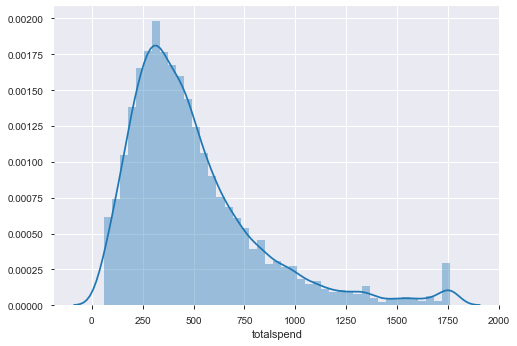

In [32]:
# For Linear regressin y(totalspend) should follow normal istribution
import seaborn as sns
sns.distplot(custdata_df_new.totalspend)

**Now as you can see distribution is right skewed so we need to take log and then plot the graph.**

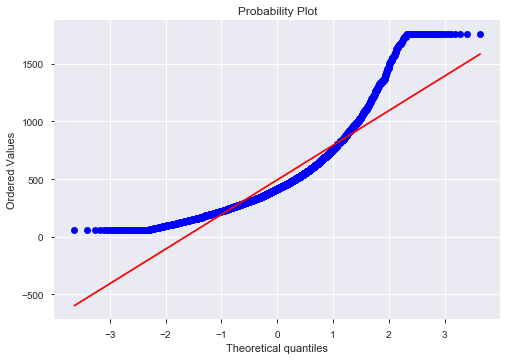

In [33]:
from scipy import stats
import pylab

stats.probplot(custdata_df_new.totalspend, dist="norm", plot=pylab )
pylab.show()

***As we can see above graph our data is not distributed normally perfectly, so we will use boxcox techniue to make it perfect normal***

In [34]:
from scipy import stats

# transform training data & save lambda value
custdata_df_new['bc_total_spend'],fitted_lambda = stats.boxcox(custdata_df_new['totalspend'])

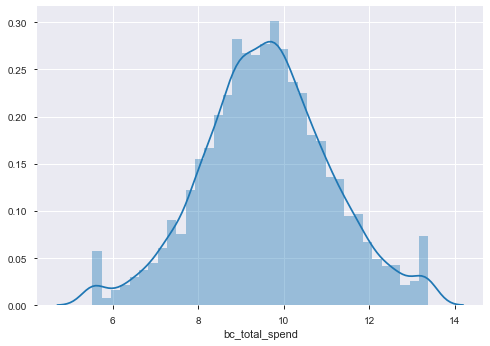

In [35]:
sns.distplot(custdata_df_new.bc_total_spend)

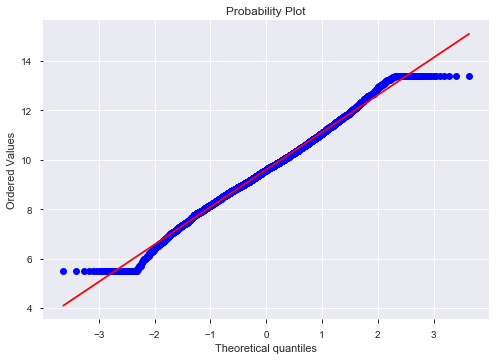

In [36]:
stats.probplot(custdata_df_new.bc_total_spend, dist="norm", plot=pylab )
pylab.show()

In [37]:
#Drop the y variables(totalspend) from dataframe because we are looking correlation between all x variables

custdata_df_new.drop(['totalspend'],axis=1,inplace=True)

### Divide data into train and test data 

In [38]:
#Splitting the data in all x variable and y variable.

feature_columns=custdata_df_new.columns.difference(['bc_total_spend'])

In [44]:
from sklearn.model_selection import train_test_split

train_x,test_x,train_y,test_y=train_test_split(custdata_df_new[feature_columns],
                                              custdata_df_new['bc_total_spend'],
                                              test_size=0.3,
                                              random_state=12)

In [45]:
print (len(train_x))
print (len(test_x))
print (len(train_y))
print (len(test_y))

3500
1500
3500
1500


### Feature selection by random forrest

In [46]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [47]:
param_grid={'n_estimators':np.arange(10,25)}

tree=GridSearchCV(RandomForestRegressor(oob_score=False,warm_start=True),param_grid,cv=2)
tree.fit(train_x,train_y)  

GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=True),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': array([10, 11, 1

In [49]:
tree.best_params_

{'n_estimators': 24}

In [50]:
# we can take n_estimators': 23
radm_clf = RandomForestRegressor(oob_score=True,n_estimators=24)
radm_clf.fit( train_x, train_y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=24,
                      n_jobs=None, oob_score=True, random_state=None, verbose=0,
                      warm_start=False)

In [51]:
radm_clf.oob_score_

0.5249886041932893

In [52]:
from sklearn import metrics

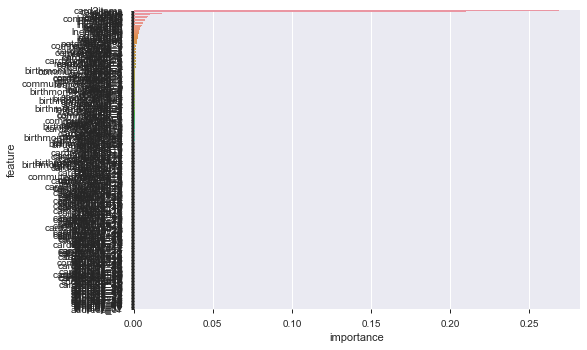

In [53]:
indices = np.argsort(radm_clf.feature_importances_)[::-1]
feature_rank = pd.DataFrame( columns = ['rank', 'feature', 'importance'] )
for f in range(train_x.shape[1]):
  feature_rank.loc[f] = [f+1,
                         train_x.columns[indices[f]],
                         radm_clf.feature_importances_[indices[f]]]
sns.barplot( y = 'feature', x = 'importance', data = feature_rank )

- As above graph is not clear so we will use below method.

In [54]:
indices = np.argsort(radm_clf.feature_importances_)[::-1]
feature_rank = pd.DataFrame( columns = ['rank', 'feature', 'importance'] )
for f in range(train_x.shape[1]):
  feature_rank.loc[f] = [f+1,
                         train_x.columns[indices[f]],
                         radm_clf.feature_importances_[indices[f]]]

feature_rank

,rank,feature,importance
0,1,card2items,0.268515
1,2,carditems,0.209670
2,3,lninc,0.065131
3,4,income,0.056613
4,5,carvalue,0.017770
...,...,...,...
396,397,employ_48,0.000000
397,398,employ_49,0.000000
398,399,employ_51,0.000000
399,400,employ_52,0.000000


In [55]:
#Select features and then convert it into list
x=feature_rank.loc[0:75,['feature']]
x=x['feature'].tolist()
print(x)

['card2items', 'carditems', 'lninc', 'income', 'carvalue', 'debtinc', 'reason_2', 'hourstv', 'age', 'creddebt', 'commutetime', 'lncardmon', 'othdebt', 'lnothdebt', 'lncreddebt', 'tenure', 'ed', 'pets', 'cardmon', 'lnlongmon', 'cardten', 'lncardten', 'lntollmon', 'longmon', 'lntollten', 'spoused', 'reside', 'longten', 'lnequipmon', 'lnlongten', 'tollten', 'tollmon', 'card_3', 'equipmon', 'card_4', 'card_2', 'lnequipten', 'lnwireten', 'equipten', 'pets_dogs', 'pets_cats', 'lnwiremon', 'gender_1', 'card2_3', 'pets_freshfish', 'card2_4', 'commutewalk_1', 'hometype_3', 'cardtype_3', 'vote_1', 'active_1', 'cardfee_1', 'card2benefit_2', 'homeown_1', 'polparty_1', 'commutebus_1', 'edcat_3', 'pets_reptiles', 'jobcat_2', 'agecat_4', 'cardbenefit_2', 'callid_1', 'cardbenefit_3', 'callwait_1', 'wiremon', 'card2tenurecat_4', 'internet_3', 'news_1', 'townsize_3.0', 'cars_4', 'card2benefit_4', 'response_03_1', 'commuterail_1', 'carown_0', 'jobsat_4', 'cartype_1']


In [56]:
# Create data frame with selected features
rf_features=['income', 'lninc', 'card_3', 'card_2', 'carvalue', 'card_4', 'commutetime', 'reason_2', 'debtinc', 'hourstv', 'creddebt', 'age', 'lncreddebt', 'tenure', 'lncardmon', 'lnothdebt', 'ed', 'othdebt', 'pets', 'lncardten', 'lntollmon', 'cardmon', 'longmon', 'card_5', 'lnlongmon', 'reside', 'spoused', 'cardten', 'lntollten', 'lnequipmon', 'lnlongten', 'tollten', 'longten', 'tollmon', 'lnwiremon', 'card2_2', 'card2_3', 'pets_freshfish', 'lnequipten', 'gender_1', 'pets_dogs', 'equipten', 'wireten', 'pets_cats', 'address_22', 'equipmon', 'wiremon', 'jobsat_4', 'commutebus_1', 'card2benefit_4']

rf_features.append('bc_total_spend')
df_rf= custdata_df_new[rf_features]

df_rf.head(5)


,income,lninc,card_3,card_2,carvalue,card_4,commutetime,reason_2,debtinc,hourstv,...,equipten,wireten,pets_cats,address_22,equipmon,wiremon,jobsat_4,commutebus_1,card2benefit_4,bc_total_spend
0,31.0,3.433987,1,0,14.3,0,22.0,0,11.1,13,...,126.1,0.00,0,0,29.50,0.00,0,0,0,7.323447
1,15.0,2.708050,0,1,6.8,0,29.0,0,18.6,18,...,1975.0,1683.55,0,0,54.85,45.65,0,1,0,6.039640
2,35.0,3.555348,0,1,18.8,0,24.0,1,9.9,21,...,0.0,0.00,2,0,0.00,0.00,1,1,0,9.243615
3,20.0,2.995732,0,1,8.7,0,38.0,0,5.7,26,...,0.0,0.00,0,0,0.00,0.00,0,0,1,9.239995
4,23.0,3.135494,0,0,10.6,1,32.0,0,1.7,27,...,0.0,410.80,0,0,0.00,19.05,0,0,0,10.063778


### Check - 2:  Find multicolinearlity

In [57]:
import statsmodels as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

In [58]:
del rf_features[-1]

In [59]:
%%capture
#gather features
features = "+".join(rf_features)

In [60]:
features

'income+lninc+card_3+card_2+carvalue+card_4+commutetime+reason_2+debtinc+hourstv+creddebt+age+lncreddebt+tenure+lncardmon+lnothdebt+ed+othdebt+pets+lncardten+lntollmon+cardmon+longmon+card_5+lnlongmon+reside+spoused+cardten+lntollten+lnequipmon+lnlongten+tollten+longten+tollmon+lnwiremon+card2_2+card2_3+pets_freshfish+lnequipten+gender_1+pets_dogs+equipten+wireten+pets_cats+address_22+equipmon+wiremon+jobsat_4+commutebus_1+card2benefit_4'

In [61]:
# get y and X dataframes based on this regression:
y, X = dmatrices('bc_total_spend~' + features,df_rf, return_type='dataframe')

In [62]:
# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

In [63]:
vif.sort_values(by=['VIF Factor'],ascending=False)

,VIF Factor,features
0,1686.859676,Intercept
23,148.928795,longmon
33,117.386519,longten
25,33.762250,lnlongmon
31,31.415359,lnlongten
14,24.098226,tenure
32,21.097455,tollten
42,19.936232,equipten
34,15.002808,tollmon
46,14.944802,equipmon


In [64]:
#Select only those features whose Vif is greater than 10.
vif1=vif[vif['VIF Factor']>10].reset_index().loc[:,['features']]
vif1.drop([0],axis=0,inplace=True)
drop_vars= vif1["features"].tolist()
drop_vars

['tenure',
 'pets',
 'cardmon',
 'longmon',
 'lnlongmon',
 'cardten',
 'lnlongten',
 'tollten',
 'longten',
 'tollmon',
 'pets_freshfish',
 'equipten',
 'wireten',
 'equipmon',
 'wiremon']

In [65]:
# dropping variables that have VIF greater than 10
df_rf.drop(drop_vars,axis=1,inplace=True)

In [66]:
df_rf.shape

(5000, 36)

### Check 3 - All x variables should have a linear relationship with Y

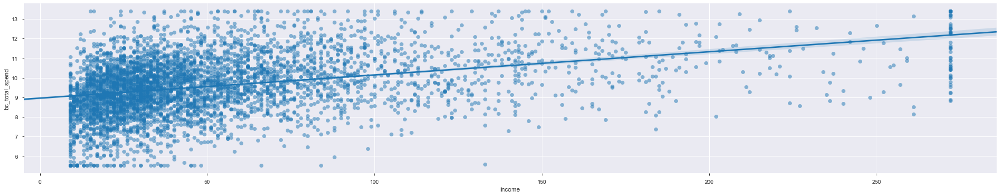

In [67]:
sns.lmplot(x="income",y="bc_total_spend",data=df_rf,aspect=5,scatter_kws={'alpha':0.5})

### Splitting data for training and testing

In [68]:
# Dropping variables one at a time which have p-values greater than 5%
feature_columns=df_rf.columns.difference(['bc_total_spend','address_22','pets_cats','lncardmon','lnequipten','spoused'
                                         ,'creddebt','reside','othdebt','debtinc','lnothdebt','jobsat_4','income','carvalue',
                                         'card2benefit_4','commutebus_1','hourstv','lnwiremon','pets_dogs','lncardten',
                                         'commutetime','lntollten','lntollmon','lnequipmon'])

In [70]:
train_x,test_x,train_y,test_y=train_test_split(df_rf[feature_columns],
                                              df_rf['bc_total_spend'],
                                               test_size=.3,
                                               random_state=123)

### Build Regression model using statsmodels.api

In [71]:
import statsmodels.api as sm

In [72]:
train_x = sm.add_constant(train_x)
test_x=sm.add_constant(test_x)
lm=sm.OLS(train_y,train_x).fit()

In [73]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:         bc_total_spend   R-squared:                       0.321
Model:                            OLS   Adj. R-squared:                  0.319
Method:                 Least Squares   F-statistic:                     137.5
Date:                Mon, 09 Dec 2019   Prob (F-statistic):          1.96e-282
Time:                        11:21:14   Log-Likelihood:                -5797.2
No. Observations:                3500   AIC:                         1.162e+04
Df Residuals:                    3487   BIC:                         1.170e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.2167      0.185     44.298      0.0

In [74]:
lm.pvalues.sort_values(ascending=False)

lncreddebt     4.873026e-02
ed             2.130607e-02
gender_1       1.676231e-03
age            1.455312e-03
card2_3        1.333622e-08
card2_2        2.124296e-11
reason_2       5.533091e-15
card_5         2.068509e-18
card_2         7.573340e-69
card_3         4.886525e-72
card_4         1.830978e-83
lninc         3.692529e-100
const          0.000000e+00
dtype: float64

In [75]:
print('Parameters:', lm.params) # Find the parameters of x i.e Beta value
print('R2: ', lm.rsquared) # Find the r**2

Parameters: const         8.216703
age          -0.003915
card2_2      -0.373883
card2_3      -0.312008
card_2       -1.231717
card_3       -1.259725
card_4       -1.296938
card_5       -1.022327
ed           -0.016243
gender_1     -0.135853
lncreddebt    0.041978
lninc         0.811933
reason_2      0.692571
dtype: float64
R2:  0.3212168530290994


### Evaluation of model accuracy

In [76]:
test_pred=lm.predict(test_x)
train_pred=lm.predict(train_x)

from sklearn import metrics

print('MSE Test:',metrics.mean_squared_error(test_y,test_pred))
print('MSE Train:',metrics.mean_squared_error(train_y,train_pred))

MSE Test: 1.500100326234747
MSE Train: 1.6076987436356145


In [77]:
print ('MAE:', metrics.mean_absolute_error(test_y, test_pred))
print ('MSE:', metrics.mean_squared_error(test_y, test_pred))
print ('RMSE:', np.sqrt(metrics.mean_squared_error(test_y, test_pred)))

MAE: 0.969636436686368
MSE: 1.500100326234747
RMSE: 1.2247858287205755


In [78]:
MAPE_train = '%.3f' % np.mean(np.abs(train_y-train_pred)/(train_y))
MAPE_test = '%.3f' % np.mean(np.abs(test_y-test_pred)/(test_y))

# print the values of MAPE for train and test
print('MAPE of training data: ', MAPE_train,  ' | ', 'MAPE of testing data: ', MAPE_test)

MAPE of training data:  0.111  |  MAPE of testing data:  0.105


### Check Normality and Residuals

***We will use Q-Q plot to examine this***

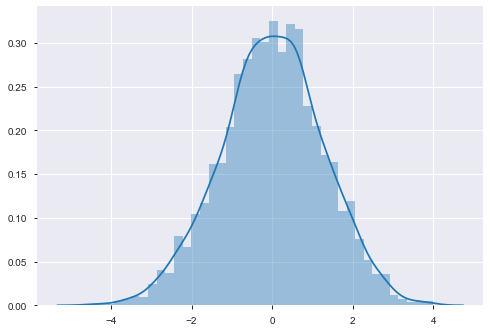

In [79]:
residuals=train_y-train_pred

import seaborn as sns

sns.distplot(residuals)

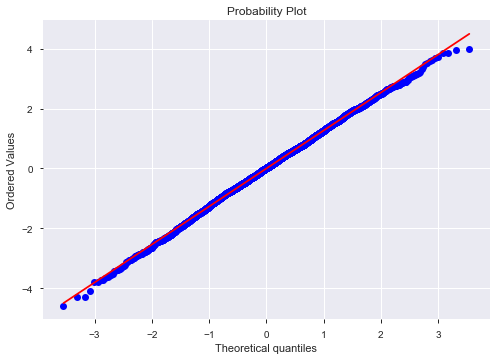

In [80]:
from scipy import stats
import pylab

stats.probplot(residuals,dist='norm',plot=pylab)
pylab.show()

***From the above histogram and Q-Q plot, shows that the residuals are normally distributed, so our  assumption is not violated***

### Predicting sales:

***We are going to credit card sales on Testing data***

In [81]:
df_rf=df_rf[feature_columns]

df_rf=sm.add_constant(df_rf)

df_rf.head()

,const,age,card2_2,card2_3,card_2,card_3,card_4,card_5,ed,gender_1,lncreddebt,lninc,reason_2
0,1.0,20,0,0,0,1,0,0,15,1,0.183079,3.433987,0
1,1.0,22,0,0,1,0,0,0,17,0,0.200505,2.708050,0
2,1.0,67,0,0,1,0,0,0,14,1,-0.074056,3.555348,1
3,1.0,23,0,1,1,0,0,0,16,0,-3.401690,2.995732,0
4,1.0,26,0,0,0,0,1,0,16,0,-1.538705,3.135494,0


In [82]:
# Final prediction on test file
from scipy.special import boxcox, inv_boxcox

pred_total_spend=inv_boxcox(lm.predict(df_rf),fitted_lambda)
pred_total_spend=pd.DataFrame(pred_total_spend.tolist())
pred_total_spend.columns = ['pred_total_spend']


#Concatenating final prediction with original test file
  
testfile = pd.concat([custdata_df, pred_total_spend], axis=1)

testfile.head()

,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,union,...,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,totalspend,pred_total_spend
0,1,2,1,20,2,September,15,3,1,1,...,0,1,1,0,0,0,1,0,149.46,368.004795
1,5,5,0,22,2,May,17,4,2,0,...,1,1,1,1,1,0,0,0,77.54,300.595399
2,3,4,1,67,6,June,14,2,2,0,...,0,0,0,0,1,0,0,0,359.97,481.766653
3,4,3,0,23,2,May,16,3,2,0,...,1,1,1,0,1,1,0,0,359.41,272.921726
4,2,2,0,26,3,July,16,3,2,0,...,1,0,1,0,0,0,1,0,507.83,329.502143


In [83]:
#Export the final result in csv.
testfile.to_csv('Final_submission_credit_spend.csv',index=False)